### Eye Pattern Recognition

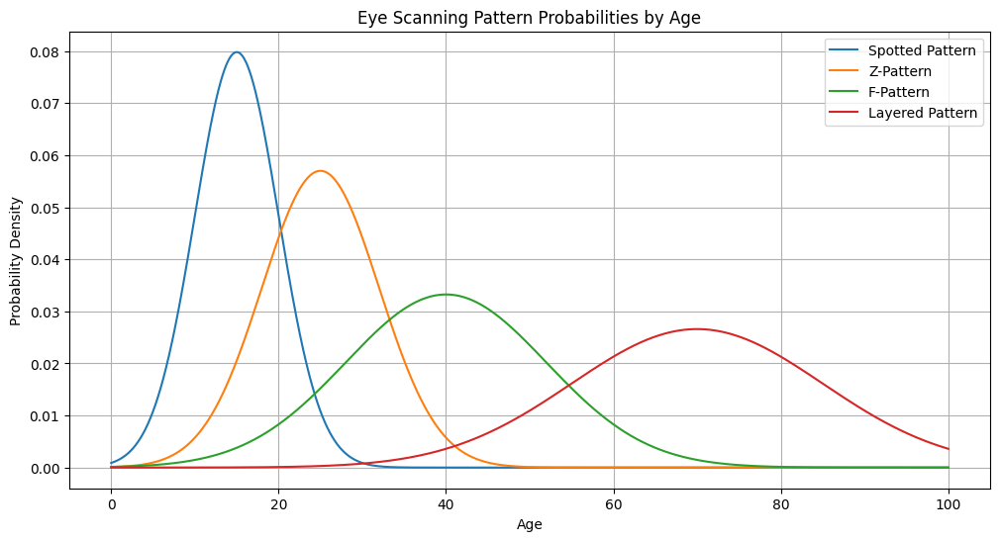


Quick predictions:
Age 15: Spotted Pattern
Age 22: Z-Pattern
Age 35: F-Pattern
Age 65: Layered Pattern
Age 75: Layered Pattern


In [1]:
import numpy as np
from scipy.stats import norm
import matplotlib.pyplot as plt

class EyePatternPredictor:
    def __init__(self):
        # Define patterns with their normal distributions (mean, std)
        self.patterns = {
            'spotted': norm(15, 5),   # Teenagers - scattered, non-linear exploration pattern
            'z_pattern': norm(25, 7),  # Young adults - quick zigzag assessment pattern
            'f_pattern': norm(40, 12), # Middle-aged - horizontal top + vertical left scanning
            'layered': norm(70, 15)    # Elderly - methodical, layer-by-layer reading
        }
        
        self.pattern_names = {
            'spotted': 'Spotted Pattern',
            'z_pattern': 'Z-Pattern',
            'f_pattern': 'F-Pattern',
            'layered': 'Layered Pattern'
        }

    def predict(self, age):
        """Predicts single most likely eye scanning pattern for given age."""
        if age < 0 or age > 120:
            return "Invalid age input"
        
        # small interval (epsilon) around the point
        epsilon = 0.1
        
        probabilities = {
            pattern: dist.cdf(age + epsilon/2) - dist.cdf(age - epsilon/2)
            for pattern, dist in self.patterns.items()
        }
        
        # Normalize probabilities to sum to 1
        total = sum(probabilities.values())
        normalized_probs = {
            k: v/total for k, v in probabilities.items()
        }
        
        # Select pattern with highest probability
        selected_pattern = max(normalized_probs, key=normalized_probs.get)
        return self.pattern_names[selected_pattern]

    def explain_prediction(self, age):
        """Shows detailed probability breakdown for given age."""
        if age < 0 or age > 120:
            return "Invalid age input"
        
        # Get raw probabilities
        raw_probs = {
            pattern: dist.pdf(age) 
            for pattern, dist in self.patterns.items()
        }
        
        # Normalize probabilities
        total = sum(raw_probs.values())
        normalized = {k: v/total for k, v in raw_probs.items()}
        
        print(f"\nProbability breakdown for age {age}:")
        print("\nRaw probabilities (from PDF):")
        for pattern, prob in raw_probs.items():
            print(f"{self.pattern_names[pattern]}: {prob:.4f}")
            
        print("\nNormalized probabilities:")
        for pattern, prob in normalized.items():
            print(f"{self.pattern_names[pattern]}: {prob:.2%}")
            
        winner = max(normalized, key=normalized.get)
        print(f"\nPredicted pattern: {self.pattern_names[winner]}")

    def visualize_distributions(self):
        """Visualizes the probability distributions for all patterns."""
        ages = np.linspace(0, 100, 1000)
        
        plt.figure(figsize=(12, 6))
        
        # Plot each distribution
        for pattern, dist in self.patterns.items():
            probabilities = dist.pdf(ages)
            plt.plot(ages, probabilities, label=self.pattern_names[pattern])
        
        # Plot styling
        plt.title('Eye Scanning Pattern Probabilities by Age')
        plt.xlabel('Age')
        plt.ylabel('Probability Density')
        plt.legend()
        plt.grid(True)
        plt.show()


# Create predictor
eye_pattern_predictor = EyePatternPredictor()

# Show distributions
eye_pattern_predictor.visualize_distributions()

# Test some predictions
test_ages = [15, 22, 35, 65, 75]
print("\nQuick predictions:")
for age in test_ages:
    pattern = eye_pattern_predictor.predict(age)
    print(f"Age {age}: {pattern}")

In [2]:
# Detailed explanation for one age
eye_pattern_predictor.explain_prediction(35)


Probability breakdown for age 35:

Raw probabilities (from PDF):
Spotted Pattern: 0.0000
Z-Pattern: 0.0205
F-Pattern: 0.0305
Layered Pattern: 0.0017

Normalized probabilities:
Spotted Pattern: 0.05%
Z-Pattern: 38.91%
F-Pattern: 57.73%
Layered Pattern: 3.31%

Predicted pattern: F-Pattern


### P(knowledge)

In [3]:
from ui_attention_predictor import Platform
from PIL import Image

age = 27
task_description = "Find the time"
# image = Image.open("images/android_home.jpg")
# image = Image.open("images/ios_home.png")
# image = Image.open("images/pc_excel.png")
image = Image.open("images/pc_google_page.png")
# image = Image.open("images/pc_google_search.png")
# platform = Platform.ANDROID
platform = Platform.DESKTOP
# platform = Platform.IOS
tech_savviness = 9

/home/yaseen/featurely/virtual/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [4]:
import sys
sys.path.append("omni_parser")

from omni_parser.util.utils import check_ocr_box, get_yolo_model, get_caption_model_processor, get_som_labeled_img
import torch
from PIL import Image
import io
import base64

DEVICE = torch.device('cuda')

yolo_model = get_yolo_model(model_path='omni_parser/weights/icon_detect/model.pt')
caption_model_processor = get_caption_model_processor(model_name="florence2", model_name_or_path="omni_parser/weights/icon_caption_florence")

def process(
    image_input,
    box_threshold = 0.05,
    iou_threshold = 0.1,
    use_paddleocr = True,
    imgsz = 640
):

    image_save_path = 'omni_parser/imgs/saved_image_demo.png'
    image_input.save(image_save_path)
    image = Image.open(image_save_path)
    box_overlay_ratio = image.size[0] / 3200
    draw_bbox_config = {
        'text_scale': 0.8 * box_overlay_ratio,
        'text_thickness': max(int(2 * box_overlay_ratio), 1),
        'text_padding': max(int(3 * box_overlay_ratio), 1),
        'thickness': max(int(3 * box_overlay_ratio), 1),
    }

    ocr_bbox_rslt, is_goal_filtered = check_ocr_box(image_save_path, display_img = False, output_bb_format='xyxy', goal_filtering=None, easyocr_args={'paragraph': False, 'text_threshold':0.9}, use_paddleocr=use_paddleocr)
    text, ocr_bbox = ocr_bbox_rslt
    dino_labled_img, label_coordinates, parsed_content_list = get_som_labeled_img(image_save_path, yolo_model, BOX_TRESHOLD = box_threshold, output_coord_in_ratio=True, ocr_bbox=ocr_bbox,draw_bbox_config=draw_bbox_config, caption_model_processor=caption_model_processor, ocr_text=text,iou_threshold=iou_threshold, imgsz=imgsz,)  
    image = Image.open(io.BytesIO(base64.b64decode(dino_labled_img)))
    print('finished processing..')
    # parsed_content_list = '\n'.join([f'icon {i}: ' + str(v) for i,v in enumerate(parsed_content_list)])
    
    return image, parsed_content_list

# Display the image using matplotlib
import matplotlib.pyplot as plt

def display_image(image):
    plt.figure(figsize=(12, 8))
    plt.imshow(image)
    plt.axis('off')
    plt.show()

Florence2LanguageForConditionalGeneration has generative capabilities, as `prepare_inputs_for_generation` is explicitly overwritten. However, it doesn't directly inherit from `GenerationMixin`. From 👉v4.50👈 onwards, `PreTrainedModel` will NOT inherit from `GenerationMixin`, and this model will lose the ability to call `generate` and other related functions.
  - If you're using `trust_remote_code=True`, you can get rid of this warning by loading the model with an auto class. See https://huggingface.co/docs/transformers/en/model_doc/auto#auto-classes
  - If you are the owner of the model architecture code, please modify your model class such that it inherits from `GenerationMixin` (after `PreTrainedModel`, otherwise you'll get an exception).
  - If you are not the owner of the model architecture class, please contact the model code owner to update it.



0: 864x1280 51 icons, 61.7ms
Speed: 10.5ms preprocess, 61.7ms inference, 127.5ms postprocess per image at shape (1, 3, 864, 1280)
len(filtered_boxes): 51 21
time to get parsed content: 0.573632001876831
finished processing..


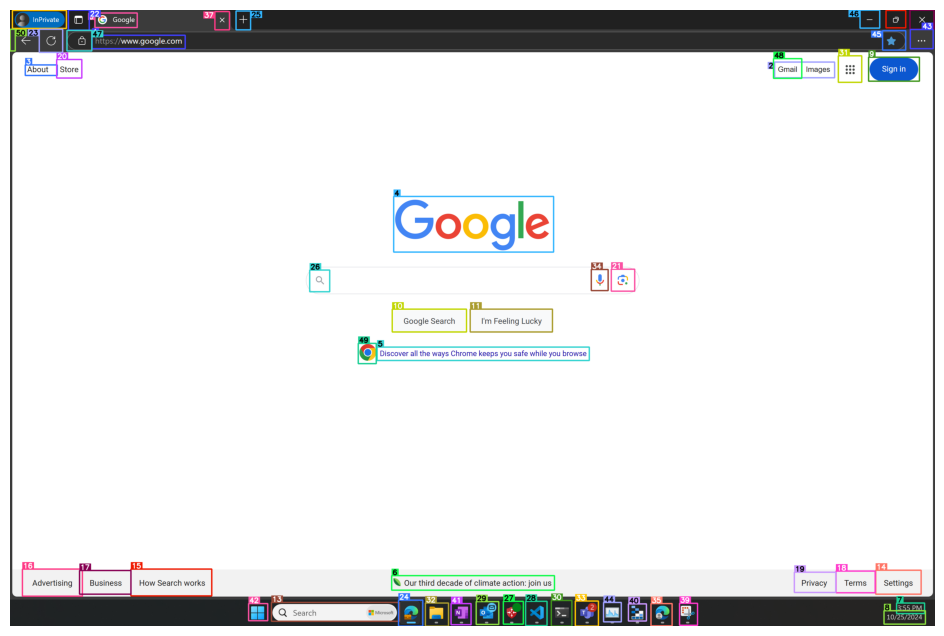

In [5]:
parsed_image, parsed_content_list = process(image)
display_image(parsed_image)

{
    "primary_focus": {
        "element_id": "element_41",
        "position": [
            0.4874961407841927,
            0.9805465493283928
        ],
        "candidate_type": "ui_element",
        "score": 0.3127851193761512,
        "component_scores": {
            "position": 1.0232888702143808,
            "task": 0.0,
            "visual": 0.057984583118369806
        },
        "scores": 0.3617088475717782,
        "reasoning": "Strong platform convention for desktop (Combined with 2 nearby points)"
    },
    "secondary_focuses": [
        {
            "element_id": "element_29",
            "position": [
                0.5160543377585675,
                0.9786938397406206
            ],
            "candidate_type": "ui_element",
            "score": 0.31193916511148095,
            "component_scores": {
                "position": 1.0193106098878562,
                "task": 0.0,
                "visual": 0.06145982145124123
            },
            "scores": 0.341

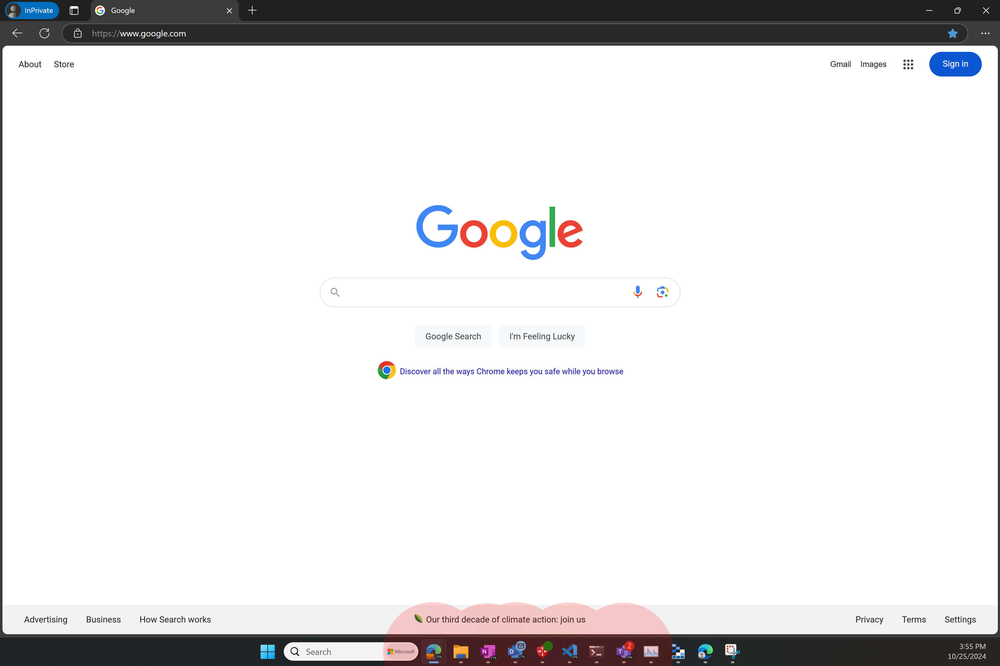

In [6]:

from ui_attention_predictor import UIAttentionPredictor
import json

# Initialize predictor
attention_predictor = UIAttentionPredictor(
    platform=platform,
    tech_savviness=tech_savviness
)

elements_data = [
    {
        "type": item["type"],
        "text": item["content"],
        "bounds": {
            "x1": min(item["bbox"][0], item["bbox"][2]),
            "x2": max(item["bbox"][0], item["bbox"][2]),
            "y1": min(item["bbox"][1], item["bbox"][3]),
            "y2": max(item["bbox"][1], item["bbox"][3])
        }
    }
    for item in parsed_content_list
]

# Get prediction
result = attention_predictor.predict_attention(
    ui_image=image,
    task=task_description,
    elements_data=elements_data
)

print(json.dumps(result, indent=4))
attention_predictor.visualize_attention(result, image, alpha=0.9)

### Decision making

In [7]:
import torch.nn as nn
from sentence_transformers import SentenceTransformer
from IPython.display import display
# from ui_tars import query_ui_tars

confidence_threshold = 0.25

# Load the model
embed_model = SentenceTransformer('all-MiniLM-L6-v2', device='cuda' if torch.cuda.is_available() else 'cpu')
cos = nn.CosineSimilarity(dim=0, eps=1e-8)

def caption_single_image(cropped_image, model, processor, prompt=None):
    if not prompt:
        if 'florence' in model.config.name_or_path:
            prompt = "<CAPTION>"
        else:
            prompt = "The image shows"
            
    device = model.device
    if model.device.type == 'cuda':
        inputs = processor(images=cropped_image, text=prompt, return_tensors="pt", do_resize=False).to(device=device, dtype=torch.float16)
    else:
        inputs = processor(images=cropped_image, text=prompt, return_tensors="pt").to(device=device)
    if 'florence' in model.config.name_or_path:
        generated_ids = model.generate(input_ids=inputs["input_ids"],pixel_values=inputs["pixel_values"],max_new_tokens=20,num_beams=1, do_sample=False)
    else:
        generated_ids = model.generate(**inputs, max_length=100, num_beams=5, no_repeat_ngram_size=2, early_stopping=True, num_return_sequences=1)
    generated_text = processor.decode(generated_ids[0], skip_special_tokens=True)
    
    return generated_text.strip()


def evaluate_cropped_icon(cropped_icon, task_description, threshold=0.4):
    prompt = "List the UI elements in this image in less than 10 words."
    # caption = query_ui_tars(prompt, cropped_icon)
    caption = "This is a screenshot of a UI"
    
    cropped_icon = cropped_icon.convert('RGB')
    cropped_icon.resize((64, 64), resample=Image.Resampling.LANCZOS)
    
    model, processor = caption_model_processor['model'], caption_model_processor['processor']
    if not prompt:
        if 'florence' in model.config.name_or_path:
            prompt = "<CAPTION>"
        else:
            prompt = "The image shows"
    
    device = model.device
    
    # Process single image
    if model.device.type == 'cuda':
        inputs = processor(images=cropped_icon, text=prompt, return_tensors="pt", do_resize=False).to(device=device, dtype=torch.float16)
    else:
        inputs = processor(images=cropped_icon, text=prompt, return_tensors="pt").to(device=device)
    
    if 'florence' in model.config.name_or_path:
        generated_ids = model.generate(
            input_ids=inputs["input_ids"],
            pixel_values=inputs["pixel_values"],
            max_new_tokens=20,
            num_beams=1,
            do_sample=False
        )
    else:
        generated_ids = model.generate(
            **inputs,
            max_length=100,
            num_beams=5,
            no_repeat_ngram_size=2,
            early_stopping=True,
            num_return_sequences=1
        )
    
    caption = processor.batch_decode(generated_ids, skip_special_tokens=True)[0].strip()
    
    embeddings = embed_model.encode([caption, task_description], convert_to_tensor=True)
    print(f"caption: {caption}, task_description: {task_description}")
    similarity = cos(embeddings[0], embeddings[1])
    print(f"similarity: {similarity.item()}")
    return similarity.item() > threshold


def draw_attention(attention_point, ui_image, alpha=0.9) -> Image:
    from PIL import Image, ImageDraw
        
    # Convert to RGBA if not already
    ui_image = ui_image.convert('RGBA')
    
    # Create a transparent overlay for the heatmap
    overlay = Image.new('RGBA', ui_image.size, (0, 0, 0, 0))
    draw = ImageDraw.Draw(overlay)
    
    # Get image dimensions for coordinate conversion
    width, height = ui_image.size
    
    # Function to convert normalized coordinates to pixel coordinates
    # Flip y-coordinate since PIL uses top-left origin
    def norm_to_pixel(x: float, y: float):
        return (int(x * width), int(y * height))  # Flip y coordinate
    
    x, y = attention_point["position"]
    
    # Convert to pixel coordinates (y is now flipped)
    px, py = norm_to_pixel(x, y)
    
    # Calculate radius based on image size (e.g., 10% of width)
    radius = int(width * 0.1)
    
    # Color intensity based only on confidence
    intensity = int(255 * alpha)
    
    # Choose color based on whether it's a hotspot or UI element
    color = (0, 255, 0, intensity) if attention_point["candidate_type"] == "platform_hotspot" else (255, 0, 0, intensity)  # Green for hotspots, Red for UI elements
    
    # Single solid circle for each attention point
    draw.ellipse(
        [(px - radius, py - radius), (px + radius, py + radius)],
        fill=color,
        outline=None
    )
    
    # Add this line to blend the overlay with the original image
    ui_image = Image.alpha_composite(ui_image, overlay)
    display(ui_image)


def create_spatial_grid(elements):
    # Sort elements by y-coordinate first (rows)
    sorted_by_y = sorted(elements, key=lambda x: x["position"][1])
    
    # Group elements into rows based on y-coordinate proximity
    rows = []
    current_row = []
    y_threshold = 0.05  # Adjust based on your UI layout
    
    for element in sorted_by_y:
        if not current_row or abs(element["position"][1] - current_row[0]["position"][1]) < y_threshold:
            current_row.append(element)
        else:
            current_row.sort(key=lambda x: x["position"][0])
            rows.append(current_row)
            current_row = [element]
    
    if current_row:
        current_row.sort(key=lambda x: x["position"][0])
        rows.append(current_row)
    
    return rows


def z_scan_pattern(elements_ref, last_element):
    if not last_element:
        # Start from top-left
        return min(elements_ref, key=lambda x: (x["position"][1], x["position"][0]))
    
    spatial_grid = create_spatial_grid(elements_ref)
    current_row_idx = None
    current_col_idx = None
    
    # Find current position in grid
    for i, row in enumerate(spatial_grid):
        for j, element in enumerate(row):
            if element["element_id"] == last_element["element_id"]:
                current_row_idx = i
                current_col_idx = j
                print(f"found last element in grid: {current_row_idx}, {current_col_idx}")
                break
        if current_row_idx is not None:
            break
    
    if current_row_idx is None:
        print("current_row_idx is None")
        return None
    
    # Z-pattern movement
    if current_row_idx % 2 == 0:  # Moving right
        print(f"length of current row: {len(spatial_grid[current_row_idx])}, moving right")
        if current_col_idx < len(spatial_grid[current_row_idx]) - 1:
            print(f"moving right, next element: {current_row_idx}, {current_col_idx + 1}")
            return spatial_grid[current_row_idx][current_col_idx + 1]
        elif current_row_idx < len(spatial_grid) - 1:
            # Move to next row, starting from right
            print(f"last element, moving down, next element: {current_row_idx + 1}, {current_col_idx - 1}")
            return spatial_grid[current_row_idx + 1][-1]
    else:  # Moving left
        print(f"length of current row: {len(spatial_grid[current_row_idx])}, moving left")
        if current_col_idx > 0:
            print(f"moving left, next element: {current_row_idx}, {current_col_idx - 1}")
            return spatial_grid[current_row_idx][current_col_idx - 1]
        elif current_row_idx < len(spatial_grid) - 1:
            # Move to next row, starting from left
            print(f"last element, moving down, next element: {current_row_idx + 1}, 0")
            return spatial_grid[current_row_idx + 1][0]
    
    return None


def find_current_position(last_element, spatial_grid):
    """Helper function to find element position in grid"""
    for i, row in enumerate(spatial_grid):
        for j, element in enumerate(row):
            if element["element_id"] == last_element["element_id"]:
                return i, j
    return None, None


def f_scan_pattern(elements_ref, last_element):
    import random
    
    if not last_element:
        print("Starting from top-left element")
        return min(elements_ref, key=lambda x: (x["position"][1], x["position"][0]))
    
    spatial_grid = create_spatial_grid(elements_ref)
    current_row_idx, current_col_idx = find_current_position(last_element, spatial_grid)
    
    print(f"\nCurrent position: Row {current_row_idx}, Column {current_col_idx}")
    
    if current_row_idx is None:
        print("Element not found in grid")
        return None
        
    # If not in first column, chance to return to first columns
    if current_col_idx > 0:
        cols_in_row = len(spatial_grid[current_row_idx])
        jump_probability = 1/(cols_in_row + 3)
        print(f"Not in first column. Chance to return to first columns: {jump_probability:.2f}")
        
        if random.random() < jump_probability:
            target_col = random.randint(0, 1)
            print(f"Jumping back to column {target_col} in current row")
            if target_col < cols_in_row:
                return spatial_grid[current_row_idx][target_col]
            print("Jump failed - target column doesn't exist")
    
    # If in first two columns of lower rows, chance to jump to top rows
    if current_row_idx > 1 and current_col_idx < 2:
        jump_probability = 1/(len(spatial_grid) + 4)
        print(f"In first two columns of lower row. Chance to jump to top rows: {jump_probability:.2f}")
        
        if random.random() < jump_probability:
            target_row = random.randint(0, 1)
            print(f"Jumping up to row {target_row}")
            if current_col_idx < len(spatial_grid[target_row]):
                return spatial_grid[target_row][current_col_idx]
            print("Jump failed - target position doesn't exist")
    
    # Default sequential movement
    print("\nAttempting sequential movement:")
    if current_col_idx < len(spatial_grid[current_row_idx]) - 1:
        print(f"Moving right to column {current_col_idx + 1}")
        return spatial_grid[current_row_idx][current_col_idx + 1]
    elif current_row_idx < len(spatial_grid) - 1:
        print(f"Moving to next row {current_row_idx + 1}, column 0")
        return spatial_grid[current_row_idx + 1][0]
    
    print("No valid moves remaining")
    return None


def layered_scan_pattern(elements_ref, last_element, layer_size=2):
    if not last_element:
        # Start from top-left
        return min(elements_ref, key=lambda x: (x["position"][1], x["position"][0]))
    
    spatial_grid = create_spatial_grid(elements_ref)
    current_row_idx = None
    current_col_idx = None
    
    # Find current position in grid
    for i, row in enumerate(spatial_grid):
        for j, element in enumerate(row):
            if element["element_id"] == last_element["element_id"]:
                current_row_idx = i
                current_col_idx = j
                print(f"found last element in grid: {current_row_idx}, {current_col_idx}")
                break
        if current_row_idx is not None:
            break
    
    if current_row_idx is None:
        print("current_row_idx is None")
        return None
    
    # Determine which layer we're in
    current_layer = current_row_idx // layer_size
    layer_start = current_layer * layer_size
    layer_end = min(layer_start + layer_size, len(spatial_grid))
    
    print(f"\nCurrent position: Row {current_row_idx}, Col {current_col_idx}")
    print(f"Currently in Layer {current_layer} (Rows {layer_start}-{layer_end-1})")
    
    # Scan within current layer
    if current_col_idx < len(spatial_grid[current_row_idx]) - 1:
        print(f"Moving right within layer {current_layer}")
        return spatial_grid[current_row_idx][current_col_idx + 1]
    elif current_row_idx < layer_end - 1:
        print(f"Moving to start of next row within layer {current_layer}")
        return spatial_grid[current_row_idx + 1][0]
    elif layer_end < len(spatial_grid):
        print(f"Layer {current_layer} complete! Moving to next layer...")
        return spatial_grid[layer_end][0]
    
    print("Reached end of grid!")
    return None


def find_next_element_scan(elements_ref, pattern, last_element):
    if pattern == "Spotted Pattern":
        visual_elements = sorted(elements_ref, key=lambda x: x["scores"], reverse=True)
        for i, element in enumerate(visual_elements):
            if element["element_id"] == last_element["element_id"]:
                return visual_elements[i+1]
    elif pattern == "Z-Pattern":
        return z_scan_pattern(elements_ref, last_element)
    elif pattern == "F-Pattern":
        return f_scan_pattern(elements_ref, last_element)
    elif pattern == "Layered Pattern":
        return layered_scan_pattern(elements_ref, last_element)
    
    return None
        

not confident, switching to scanning pattern: Z-Pattern
elements_ref:  33
scanning Z-Pattern..
element: {
    "element_id": "element_46",
    "position": [
        0.9294535350416795,
        0.014590088003705419
    ],
    "candidate_type": "ui_element",
    "score": 0.012281916136578233,
    "component_scores": {
        "position": 0.03670783715104212,
        "task": 0.0,
        "visual": 0.012695649912655961
    },
    "scores": 0.012281916136578233,
    "reasoning": "Based on general UI principles"
}


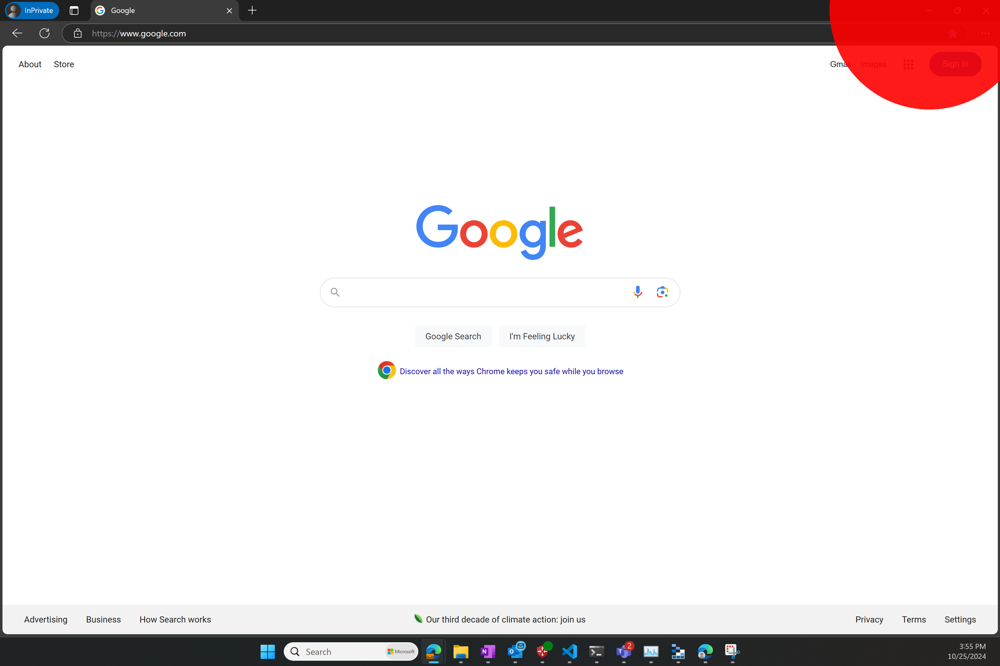

caption: Minimize, task_description: Find the time
similarity: 0.2341688573360443
task not completed, element not found..
scanning Z-Pattern..
found last element in grid: 0, 4
length of current row: 7, moving right
moving right, next element: 0, 5
element: {
    "element_id": "element_45",
    "position": [
        0.9556962025316456,
        0.04909680407596109
    ],
    "candidate_type": "ui_element",
    "score": 0.015473419867259463,
    "component_scores": {
        "position": 0.04109068999523515,
        "task": 0.0,
        "visual": 0.031462128686889176
    },
    "scores": 0.016892069463246884,
    "reasoning": "Based on general UI principles (Combined with 2 nearby points)"
}


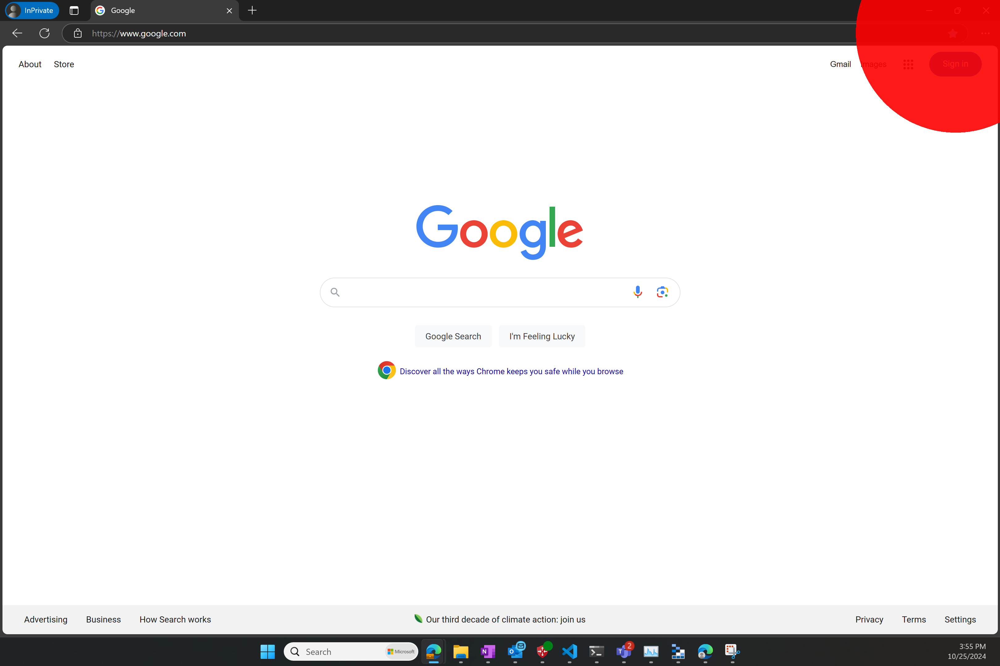

caption: Bookmark, task_description: Find the time
similarity: 0.0904402881860733
task not completed, element not found..
scanning Z-Pattern..
found last element in grid: 0, 5
length of current row: 7, moving right
moving right, next element: 0, 6
element: {
    "element_id": "element_38",
    "position": [
        0.9857980858289596,
        0.015516442797591477
    ],
    "candidate_type": "ui_element",
    "score": 0.005371955505114005,
    "component_scores": {
        "position": 0.013075685265899133,
        "task": 0.0,
        "visual": 0.014492499253442655
    },
    "scores": 0.005371955505114005,
    "reasoning": "Based on general UI principles"
}


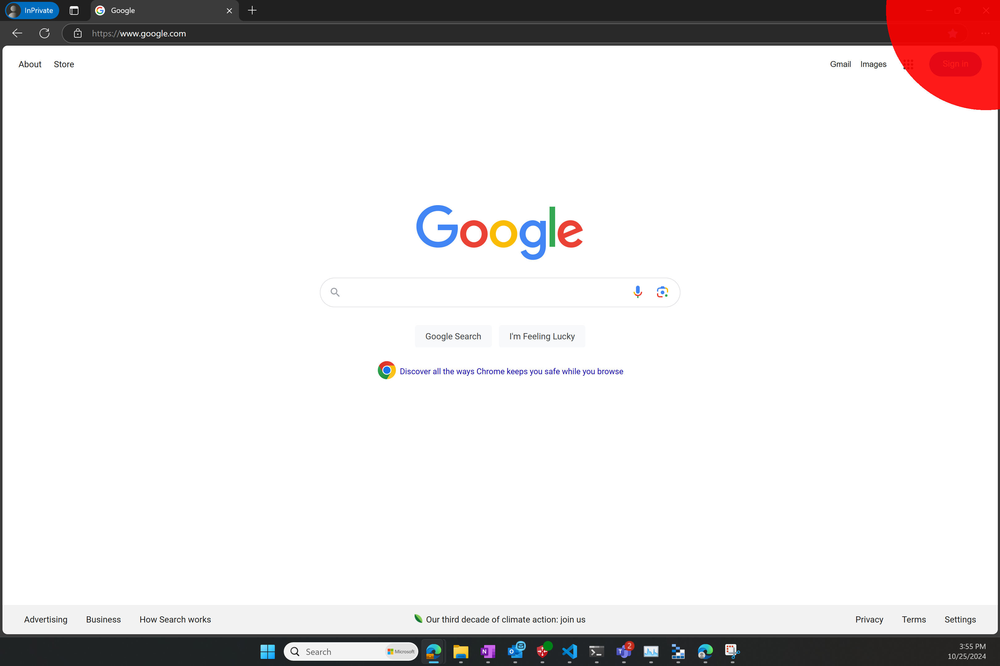

caption: Close, task_description: Find the time
similarity: 0.13714279234409332
task not completed, element not found..
scanning Z-Pattern..
found last element in grid: 0, 6
length of current row: 7, moving right
last element, moving down, next element: 1, 5
element: {
    "element_id": "element_31",
    "position": [
        0.907996295152825,
        0.09564613246873553
    ],
    "candidate_type": "ui_element",
    "score": 0.031421812403128795,
    "component_scores": {
        "position": 0.08256233540352644,
        "task": 0.0,
        "visual": 0.06653111782070867
    },
    "scores": 0.03456005135929226,
    "reasoning": "Based on general UI principles (Combined with 1 nearby points)"
}


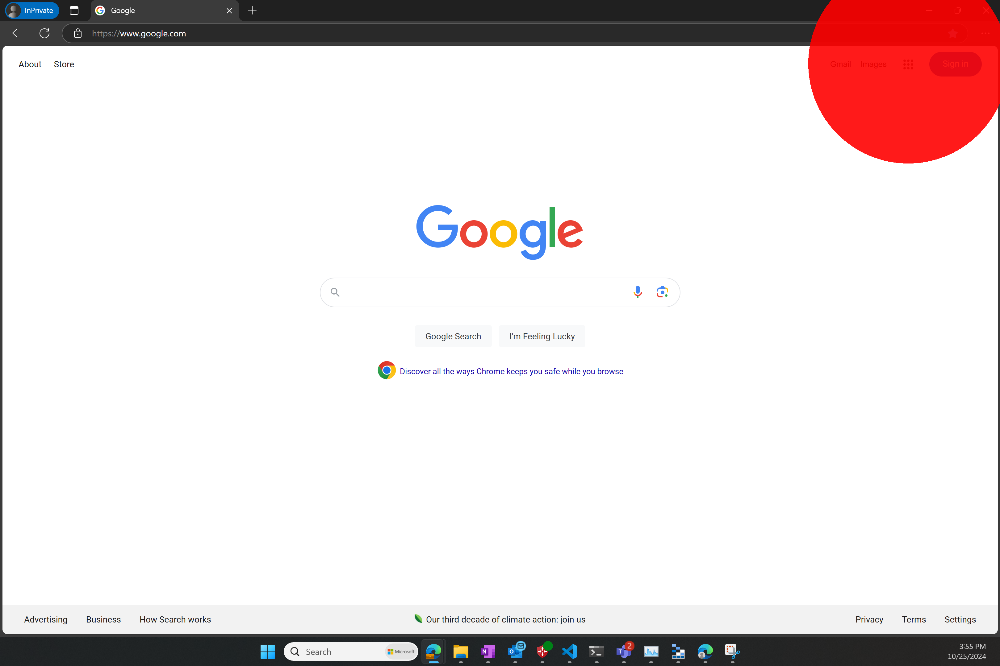

caption: More options, task_description: Find the time
similarity: 0.06401535868644714
task not completed, element not found..
scanning Z-Pattern..
found last element in grid: 1, 2
length of current row: 3, moving left
moving left, next element: 1, 1
element: {
    "element_id": "element_48",
    "position": [
        0.8405372028403828,
        0.09471977767484947
    ],
    "candidate_type": "ui_element",
    "score": 0.040440193854635646,
    "component_scores": {
        "position": 0.1106062049872617,
        "task": 0.0,
        "visual": 0.07258332358457135
    },
    "scores": 0.04431819238371906,
    "reasoning": "Based on general UI principles (Combined with 1 nearby points)"
}


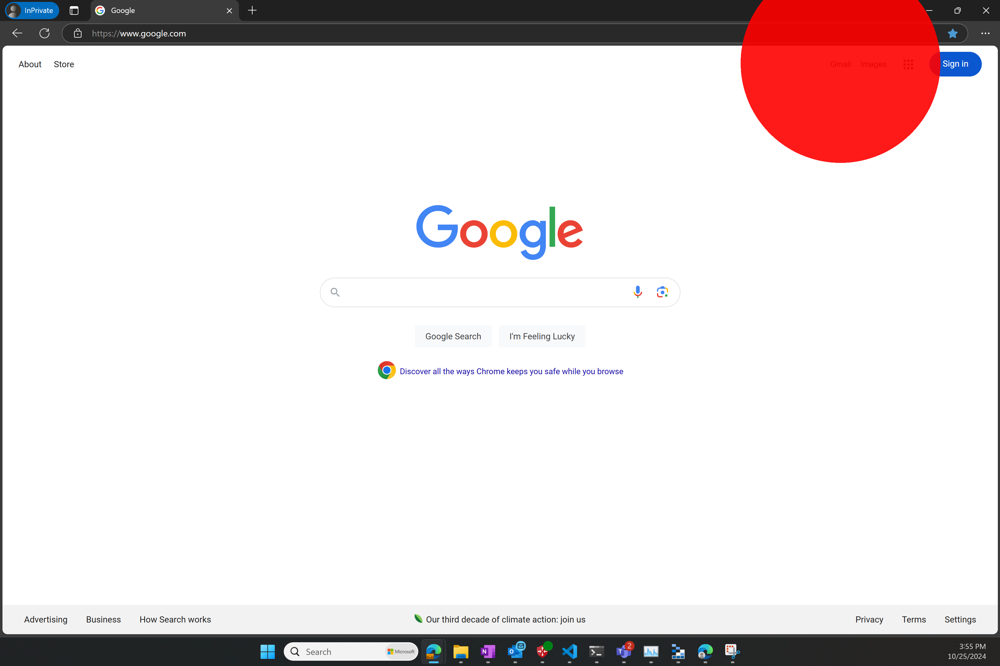

caption: gmail, task_description: Find the time
similarity: 0.0680791586637497
task not completed, element not found..
scanning Z-Pattern..
found last element in grid: 1, 1
length of current row: 3, moving left
moving left, next element: 1, 0
element: {
    "element_id": "element_20",
    "position": [
        0.063908613769682,
        0.0951829550717925
    ],
    "candidate_type": "ui_element",
    "score": 0.02833019669822172,
    "component_scores": {
        "position": 0.06974449048020434,
        "task": 0.0,
        "visual": 0.07406849554160416
    },
    "scores": 0.031860253898030426,
    "reasoning": "Based on general UI principles (Combined with 2 nearby points)"
}


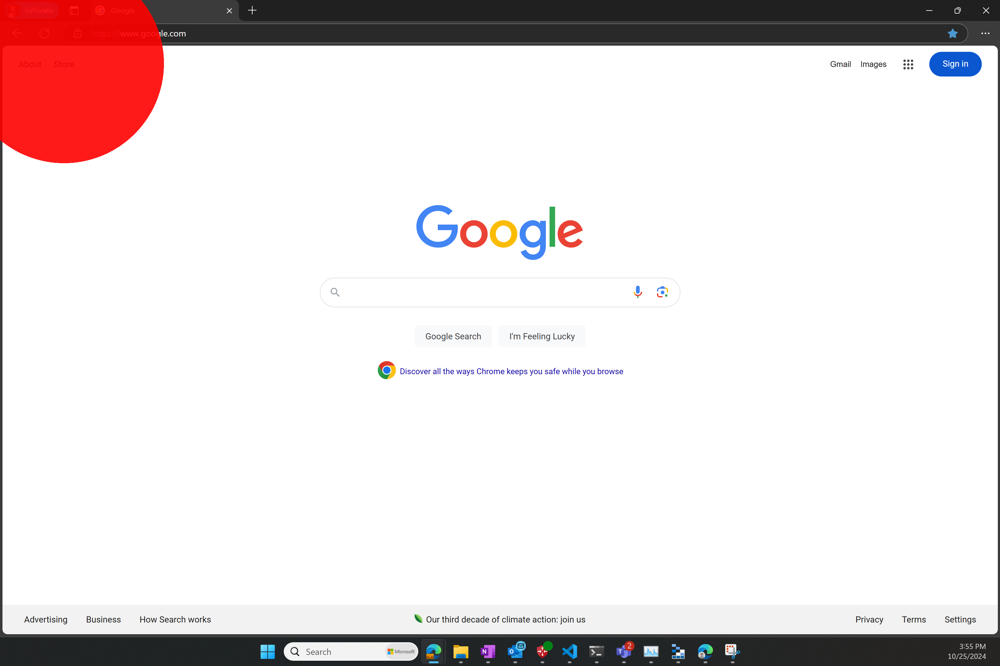

caption: Store, task_description: Find the time
similarity: 0.20013879239559174
task not completed, element not found..
scanning Z-Pattern..
found last element in grid: 1, 0
length of current row: 3, moving left
last element, moving down, next element: 2, 0
element: {
    "element_id": "element_4",
    "position": [
        0.5009262117937635,
        0.3473830477072719
    ],
    "candidate_type": "ui_element",
    "score": 0.1125421549210999,
    "component_scores": {
        "position": 0.34503174709082046,
        "task": 0.0,
        "visual": 0.09032630793853753
    },
    "scores": 0.1125421549210999,
    "reasoning": "Based on general UI principles"
}


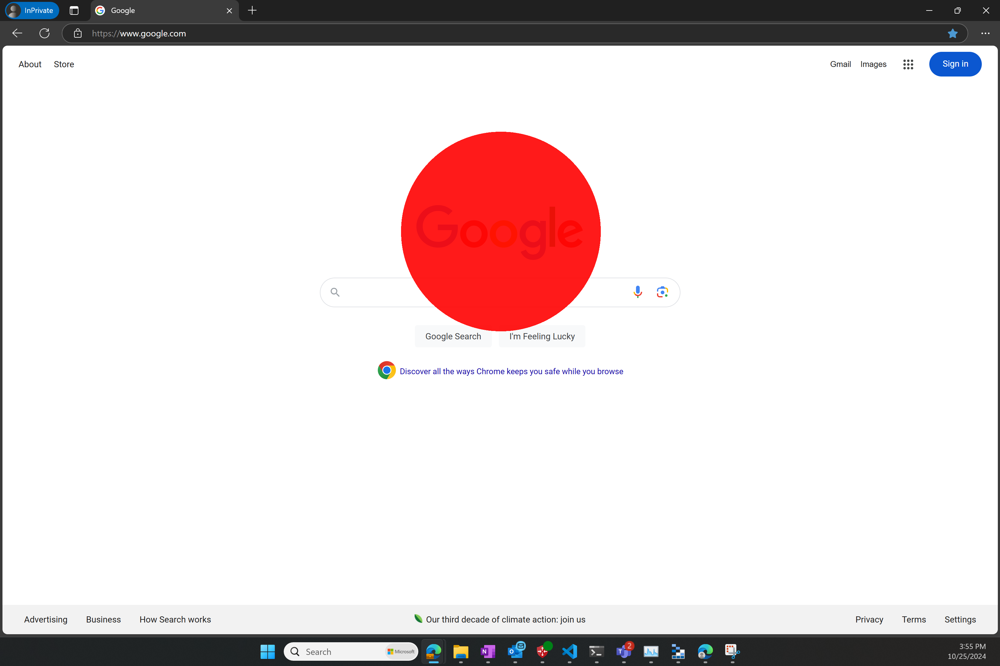

caption: Google., task_description: Find the time
similarity: 0.14728569984436035
task not completed, element not found..
scanning Z-Pattern..
found last element in grid: 2, 0
length of current row: 1, moving right
last element, moving down, next element: 3, -1
element: {
    "element_id": "element_34",
    "position": [
        0.6373880827415869,
        0.4381658175081056
    ],
    "candidate_type": "ui_element",
    "score": 0.11247544965908746,
    "component_scores": {
        "position": 0.3462501520877462,
        "task": 0.0,
        "visual": 0.08600404032763609
    },
    "scores": 0.12327058604627493,
    "reasoning": "Based on general UI principles (Combined with 1 nearby points)"
}


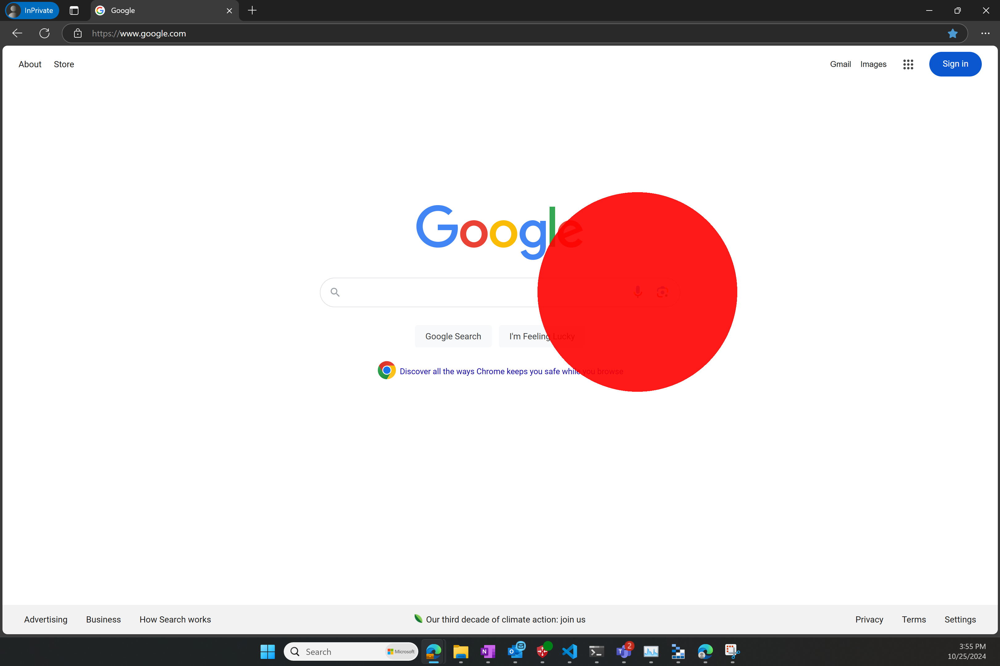

caption: Microscope, task_description: Find the time
similarity: 0.11857247352600098
task not completed, element not found..
scanning Z-Pattern..
found last element in grid: 3, 1
length of current row: 2, moving left
moving left, next element: 3, 0
element: {
    "element_id": "element_26",
    "position": [
        0.33467119481321395,
        0.43955534969893467
    ],
    "candidate_type": "ui_element",
    "score": 0.10711753664421196,
    "component_scores": {
        "position": 0.33046355830478324,
        "task": 0.0,
        "visual": 0.07978469152776993
    },
    "scores": 0.10711753664421196,
    "reasoning": "Based on general UI principles"
}


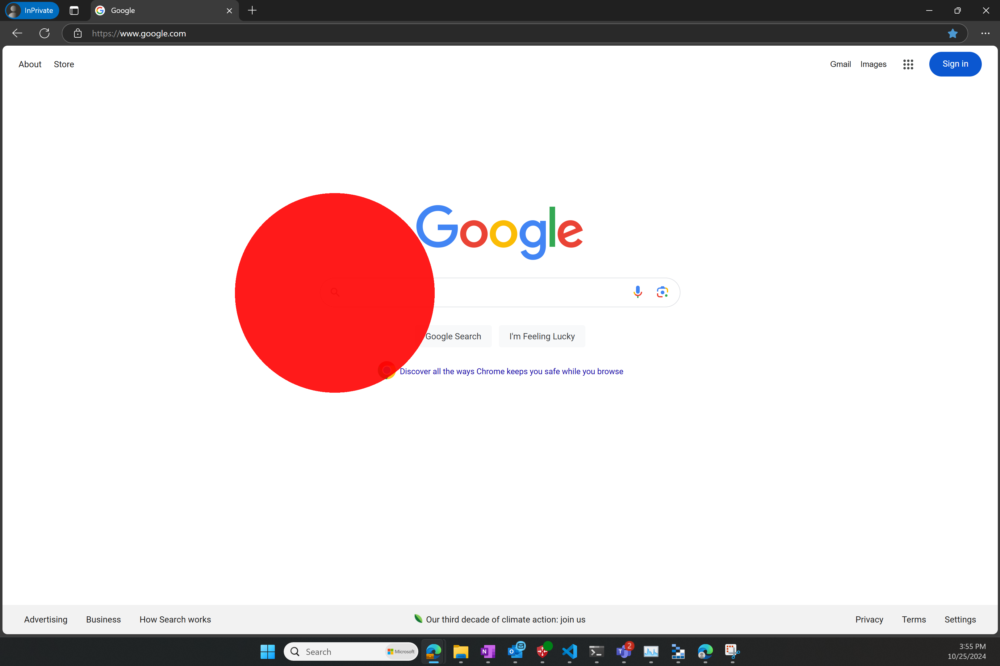

caption: Search function., task_description: Find the time
similarity: 0.23107948899269104
task not completed, element not found..
scanning Z-Pattern..
found last element in grid: 3, 0
length of current row: 2, moving left
last element, moving down, next element: 4, 0
element: {
    "element_id": "element_10",
    "position": [
        0.4532263044149429,
        0.5039370078740157
    ],
    "candidate_type": "ui_element",
    "score": 0.13144901072537962,
    "component_scores": {
        "position": 0.4107919619725407,
        "task": 0.0,
        "visual": 0.0821142213361741
    },
    "scores": 0.13144901072537962,
    "reasoning": "Based on general UI principles"
}


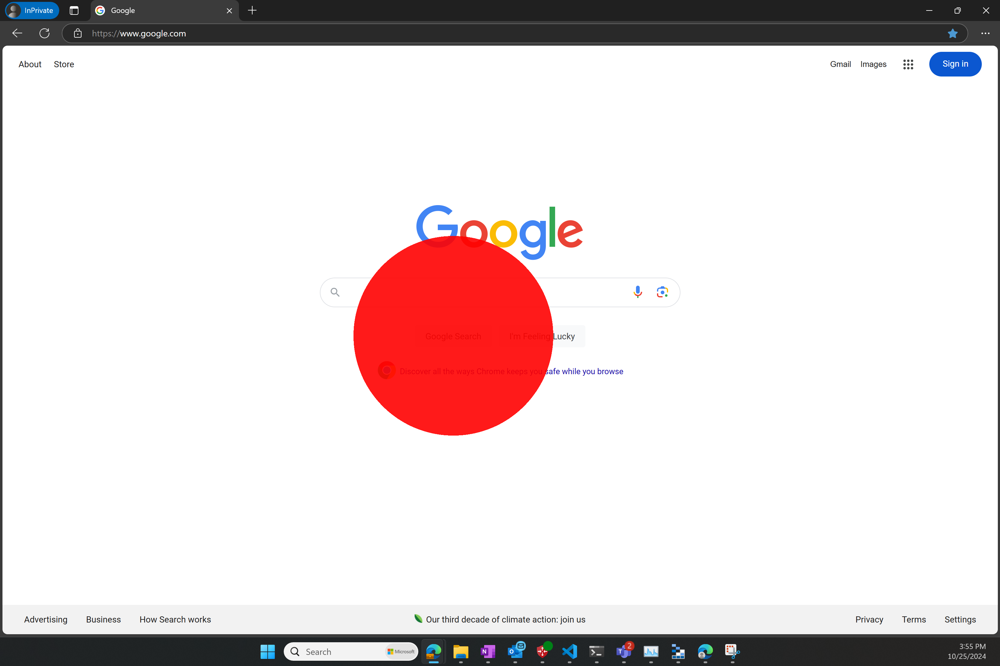

caption: Google Search, task_description: Find the time
similarity: 0.1616072952747345
task not completed, element not found..
scanning Z-Pattern..
found last element in grid: 4, 0
length of current row: 2, moving right
moving right, next element: 4, 1
element: {
    "element_id": "element_11",
    "position": [
        0.5418338993516517,
        0.5039370078740157
    ],
    "candidate_type": "ui_element",
    "score": 0.132421494212766,
    "component_scores": {
        "position": 0.41385366747971464,
        "task": 0.0,
        "visual": 0.08265393968851614
    },
    "scores": 0.132421494212766,
    "reasoning": "Based on general UI principles"
}


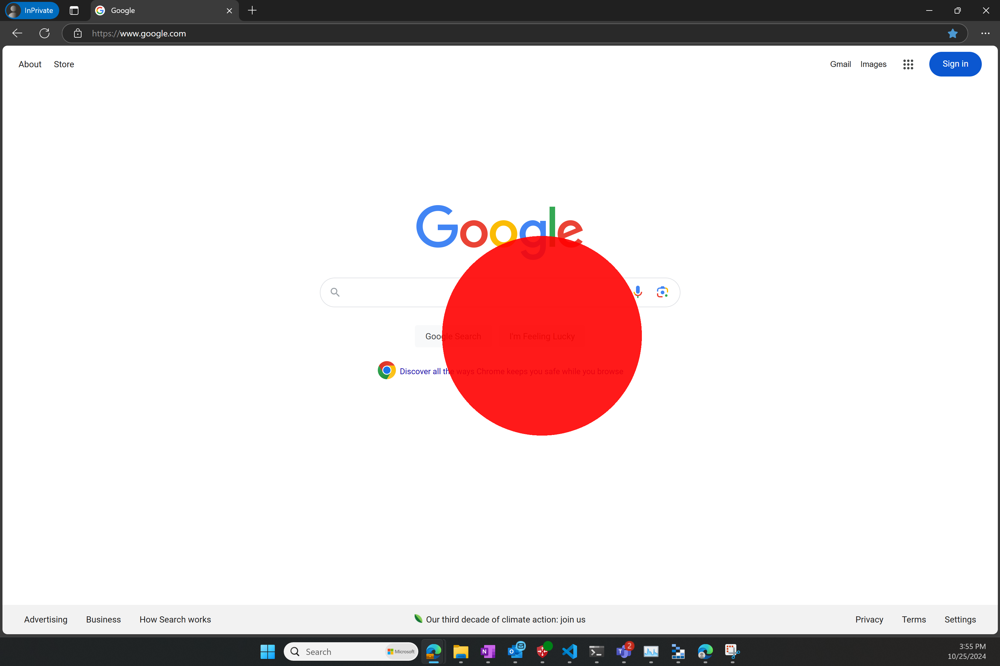

caption: FeelingLu, task_description: Find the time
similarity: 0.14043036103248596
task not completed, element not found..
scanning Z-Pattern..
found last element in grid: 4, 1
length of current row: 2, moving right
last element, moving down, next element: 5, 0
element: {
    "element_id": "element_5",
    "position": [
        0.511268910157456,
        0.5578971746178787
    ],
    "candidate_type": "ui_element",
    "score": 0.13006893535881991,
    "component_scores": {
        "position": 0.4032971887311388,
        "task": 0.0,
        "visual": 0.0907977873947829
    },
    "scores": 0.13006893535881991,
    "reasoning": "Based on general UI principles"
}


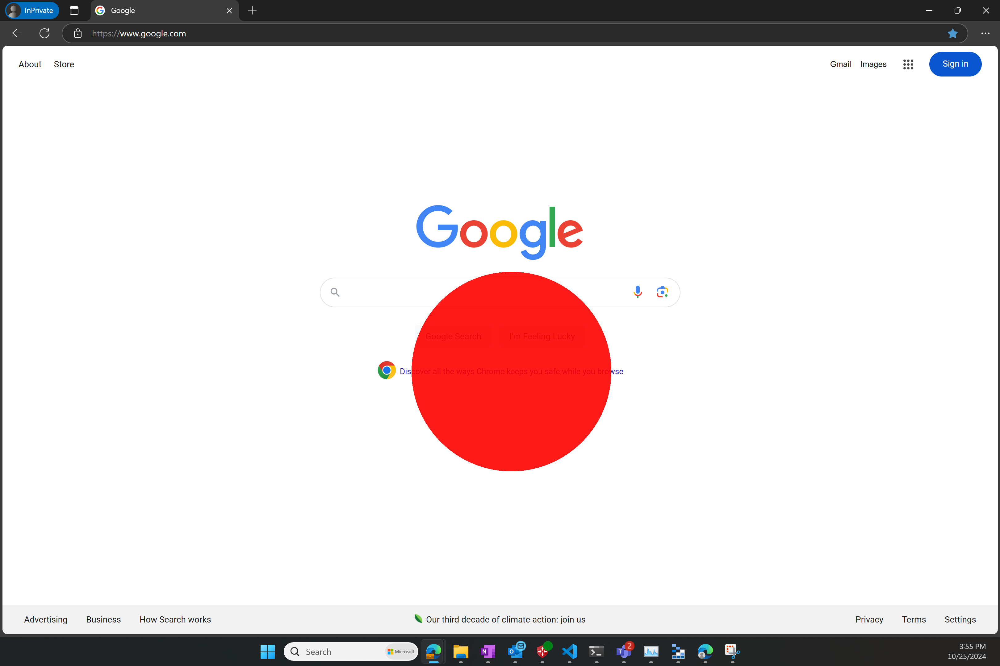

caption: Home keeps, task_description: Find the time
similarity: 0.1945369839668274
task not completed, element not found..
scanning Z-Pattern..
found last element in grid: 5, 1
length of current row: 2, moving left
moving left, next element: 5, 0
element: {
    "element_id": "element_49",
    "position": [
        0.3860759493670886,
        0.5574339972209357
    ],
    "candidate_type": "ui_element",
    "score": 0.11996812364035737,
    "component_scores": {
        "position": 0.36061113921410815,
        "task": 0.0,
        "visual": 0.11784781876124927
    },
    "scores": 0.11996812364035737,
    "reasoning": "Based on general UI principles"
}


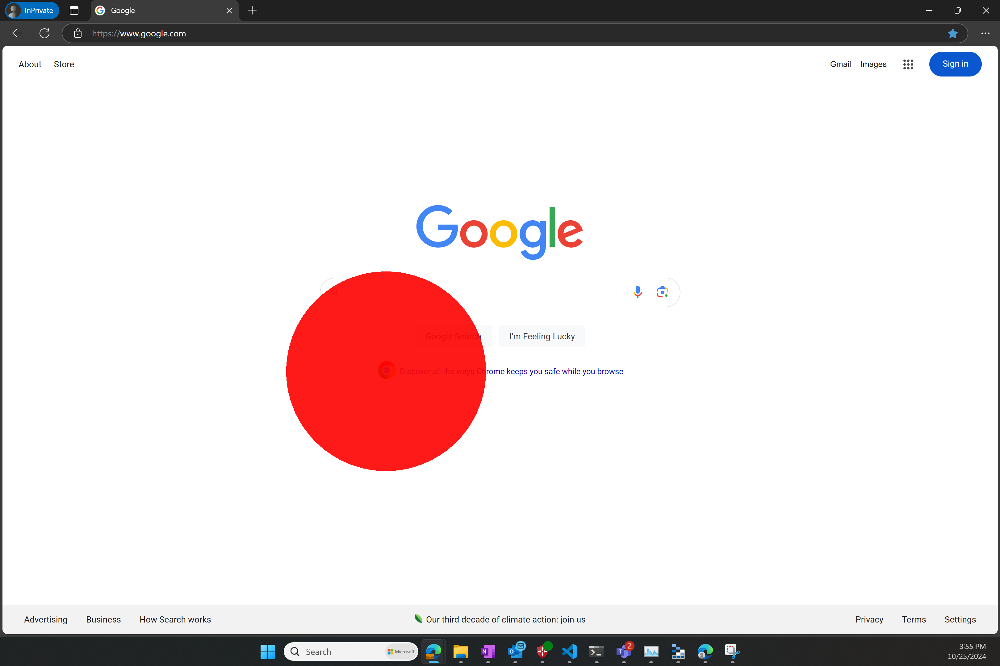

caption: Google Chrome web browser., task_description: Find the time
similarity: 0.04683104157447815
task not completed, element not found..
scanning Z-Pattern..
found last element in grid: 5, 0
length of current row: 2, moving left
last element, moving down, next element: 6, 0
element: {
    "element_id": "element_16",
    "position": [
        0.04569311515899969,
        0.9293654469661881
    ],
    "candidate_type": "ui_element",
    "score": 0.023366961681050444,
    "component_scores": {
        "position": 0.051029332305269445,
        "task": 0.0,
        "visual": 0.0805816198946961
    },
    "scores": 0.023366961681050444,
    "reasoning": "Based on general UI principles"
}


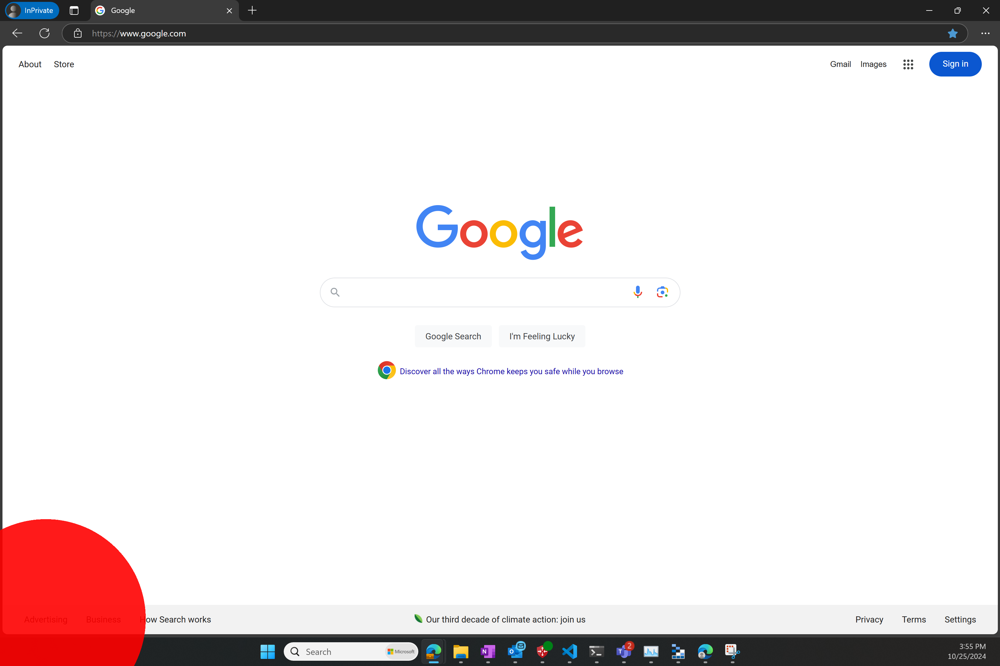

caption: Advertising, task_description: Find the time
similarity: 0.1505519300699234
task not completed, element not found..
scanning Z-Pattern..
found last element in grid: 6, 0
length of current row: 9, moving right
moving right, next element: 6, 1
element: {
    "element_id": "element_17",
    "position": [
        0.1028095091077493,
        0.928902269569245
    ],
    "candidate_type": "ui_element",
    "score": 0.030141115432324554,
    "component_scores": {
        "position": 0.07625146888314373,
        "task": 0.0,
        "visual": 0.07265674767381435
    },
    "scores": 0.030141115432324554,
    "reasoning": "Based on general UI principles"
}


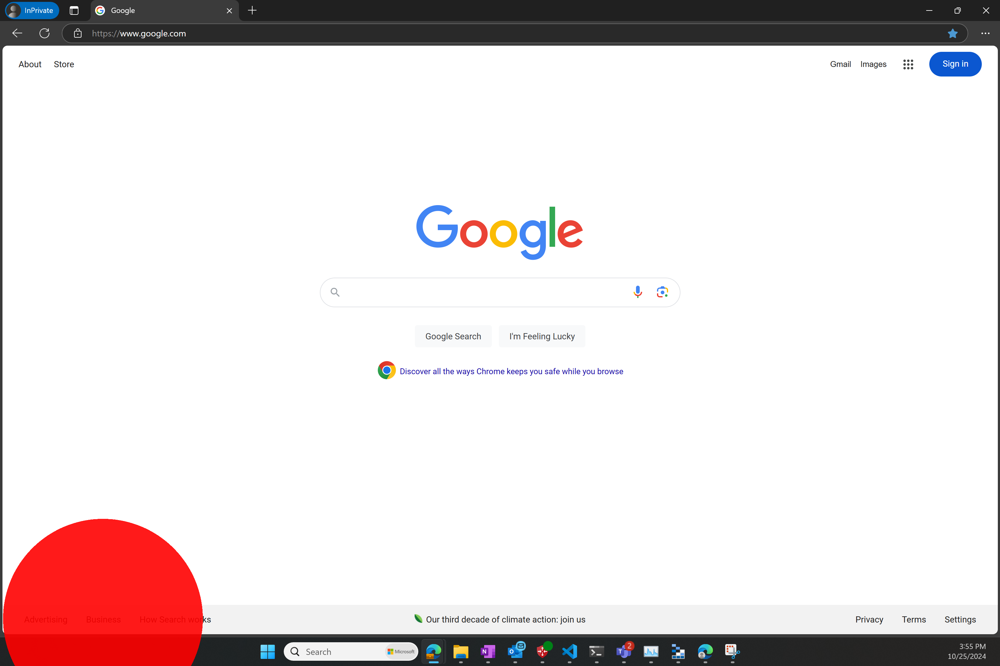

caption: Business, task_description: Find the time
similarity: 0.1919732689857483
task not completed, element not found..
scanning Z-Pattern..
found last element in grid: 6, 1
length of current row: 9, moving right
moving right, next element: 6, 2
element: {
    "element_id": "element_15",
    "position": [
        0.1742821858598333,
        0.9291338582677166
    ],
    "candidate_type": "ui_element",
    "score": 0.039437559419482314,
    "component_scores": {
        "position": 0.10476275388813655,
        "task": 0.0,
        "visual": 0.08008733253041346
    },
    "scores": 0.039437559419482314,
    "reasoning": "Based on general UI principles"
}


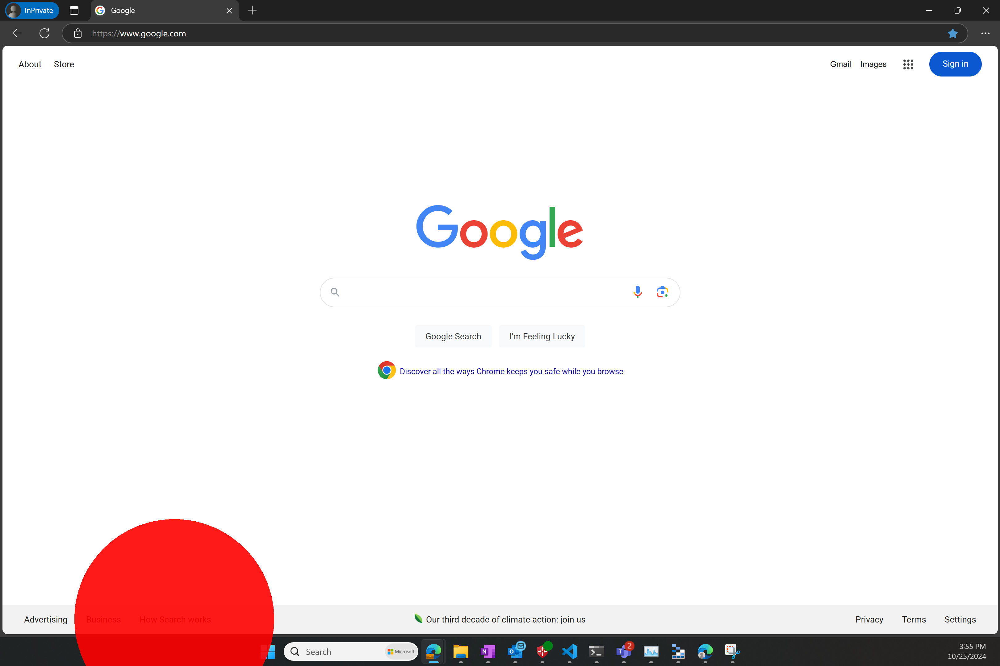

caption: Search Word, task_description: Find the time
similarity: 0.20827195048332214
task not completed, element not found..
scanning Z-Pattern..
found last element in grid: 6, 2
length of current row: 9, moving right
moving right, next element: 6, 3
element: {
    "element_id": "element_42",
    "position": [
        0.26813831429453533,
        0.9773043075497916
    ],
    "candidate_type": "ui_element",
    "score": 0.18837363355904138,
    "component_scores": {
        "position": 0.5968211870097441,
        "task": 0.0,
        "visual": 0.09327277456118159
    },
    "scores": 0.18837363355904138,
    "reasoning": "Based on general UI principles"
}


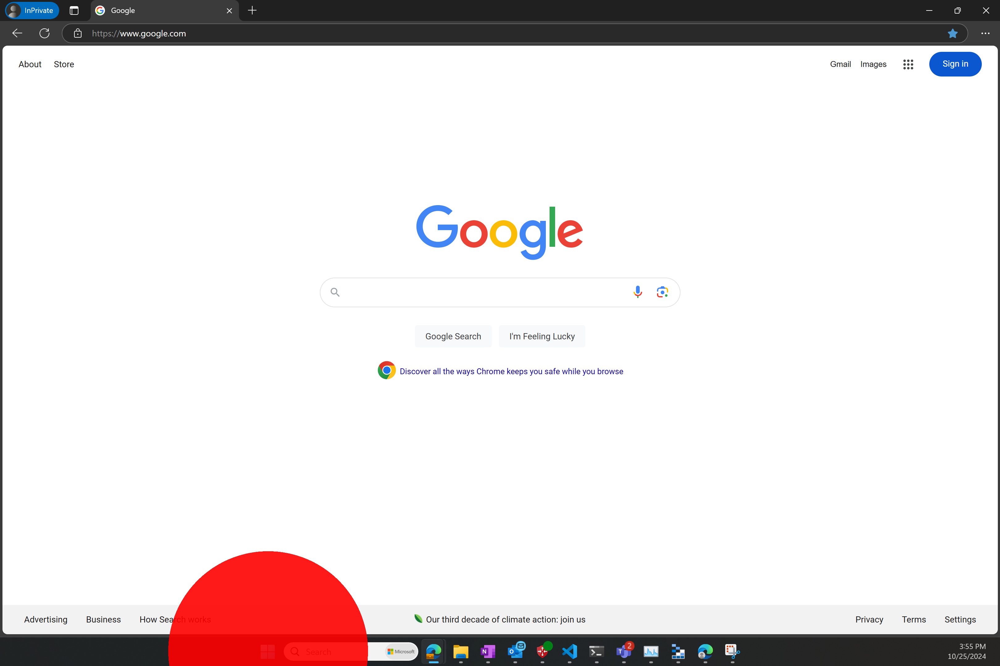

caption: The Windows operating system., task_description: Find the time
similarity: 0.10032449662685394
task not completed, element not found..
scanning Z-Pattern..
found last element in grid: 6, 3
length of current row: 9, moving right
moving right, next element: 6, 4
element: {
    "element_id": "element_13",
    "position": [
        0.3516517443655449,
        0.9768411301528486
    ],
    "candidate_type": "ui_element",
    "score": 0.24179849764720648,
    "component_scores": {
        "position": 0.767608191137275,
        "task": 0.0,
        "visual": 0.11516040306024014
    },
    "scores": 0.24179849764720648,
    "reasoning": "Strong platform convention for desktop"
}


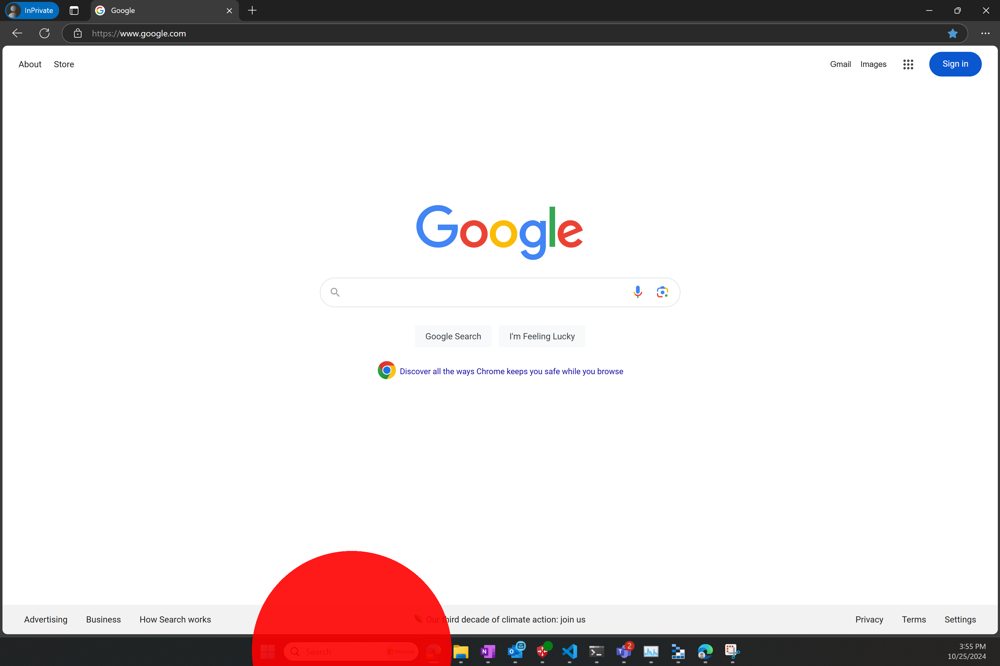

caption: a loading or buffering indicator., task_description: Find the time
similarity: -0.037436649203300476
task not completed, element not found..
scanning Z-Pattern..
found last element in grid: 6, 4
length of current row: 9, moving right
moving right, next element: 6, 5
element: {
    "element_id": "element_6",
    "position": [
        0.5004631058968817,
        0.9300602130616026
    ],
    "candidate_type": "ui_element",
    "score": 0.0590479199509597,
    "component_scores": {
        "position": 0.17239317102641682,
        "task": 0.0,
        "visual": 0.07329968643034654
    },
    "scores": 0.0590479199509597,
    "reasoning": "Based on general UI principles"
}


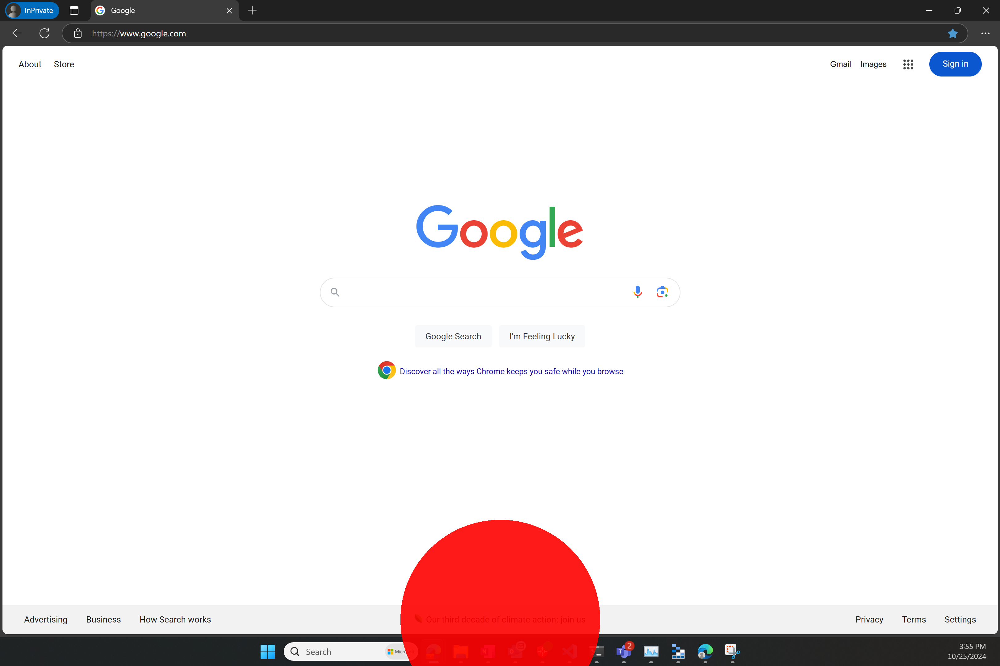

caption: Clima, task_description: Find the time
similarity: 0.09280528873205185
task not completed, element not found..
scanning Z-Pattern..
found last element in grid: 6, 5
length of current row: 9, moving right
moving right, next element: 6, 6
element: {
    "element_id": "element_40",
    "position": [
        0.6781414016671812,
        0.9777674849467346
    ],
    "candidate_type": "ui_element",
    "score": 0.21800119301332024,
    "component_scores": {
        "position": 0.7070584065397711,
        "task": 0.0,
        "visual": 0.05883671051388896
    },
    "scores": 0.2380946908504494,
    "reasoning": "Strong platform convention for desktop (Combined with 1 nearby points)"
}


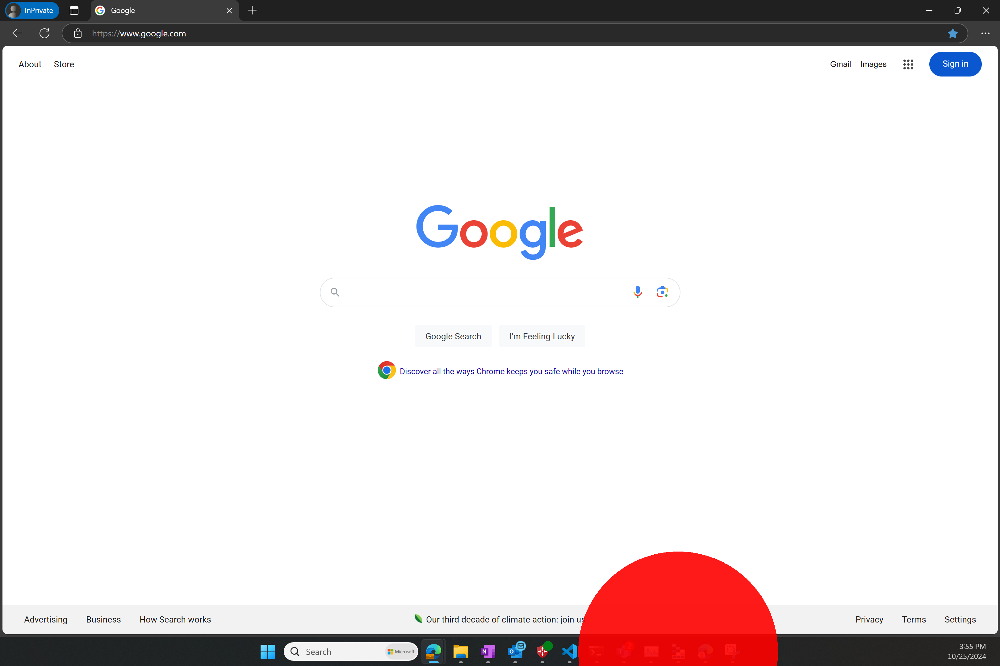

caption: Microsoft 365., task_description: Find the time
similarity: 0.03833475708961487
task not completed, element not found..
scanning Z-Pattern..
found last element in grid: 6, 6
length of current row: 9, moving right
moving right, next element: 6, 7
element: {
    "element_id": "element_19",
    "position": [
        0.8701759802408151,
        0.928902269569245
    ],
    "candidate_type": "ui_element",
    "score": 0.03284676741363531,
    "component_scores": {
        "position": 0.08745734103978121,
        "task": 0.0,
        "visual": 0.0660956510170095
    },
    "scores": 0.03560176146043719,
    "reasoning": "Based on general UI principles (Combined with 1 nearby points)"
}


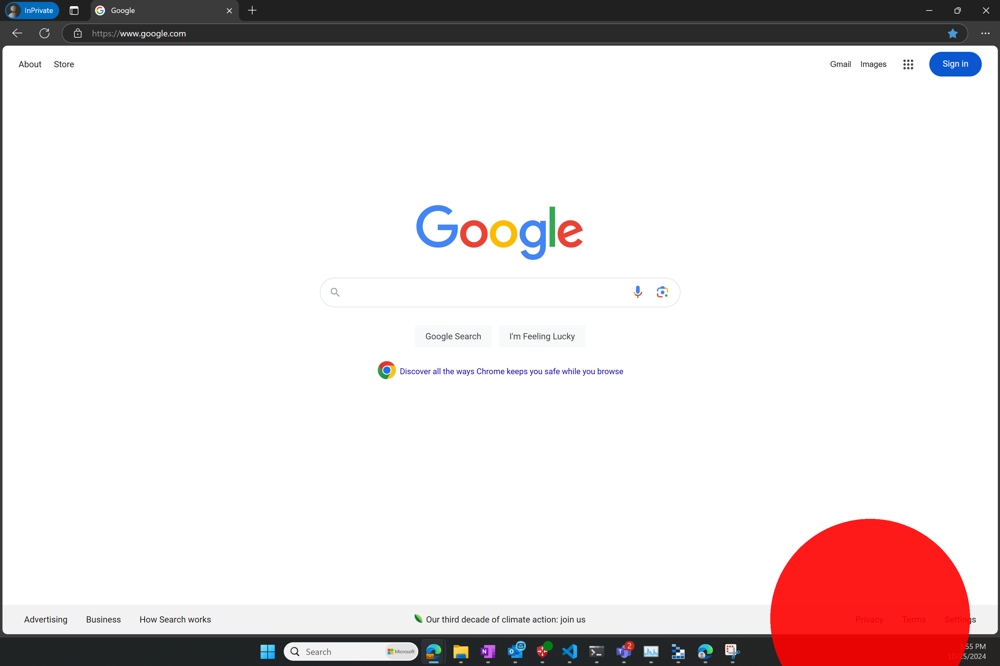

caption: privacy, task_description: Find the time
similarity: 0.15607695281505585
task not completed, element not found..
scanning Z-Pattern..
found last element in grid: 6, 7
length of current row: 9, moving right
moving right, next element: 6, 8
element: {
    "element_id": "element_14",
    "position": [
        0.9603272615004631,
        0.9286706808707735
    ],
    "candidate_type": "ui_element",
    "score": 0.021741627150833144,
    "component_scores": {
        "position": 0.04859298492309623,
        "task": 0.0,
        "visual": 0.07163731673904275
    },
    "scores": 0.021741627150833144,
    "reasoning": "Based on general UI principles"
}


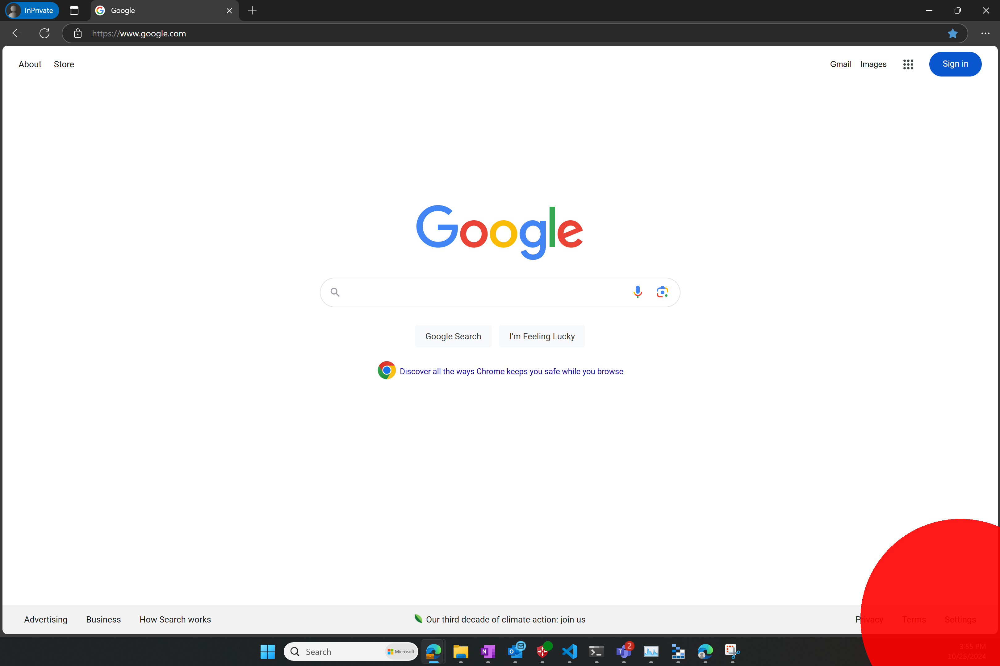

caption: Settings, task_description: Find the time
similarity: 0.14977963268756866
task not completed, element not found..
scanning Z-Pattern..
found last element in grid: 6, 8
length of current row: 9, moving right
last element, moving down, next element: 7, 7
element: {
    "element_id": "element_8",
    "position": [
        0.9668107440568077,
        0.9854099119962946
    ],
    "candidate_type": "ui_element",
    "score": 0.18477981501206753,
    "component_scores": {
        "position": 0.6072588245515327,
        "task": 0.0,
        "visual": 0.026021676466077188
    },
    "scores": 0.4012247613261848,
    "reasoning": "Based on general UI principles (Combined with 2 nearby points)"
}


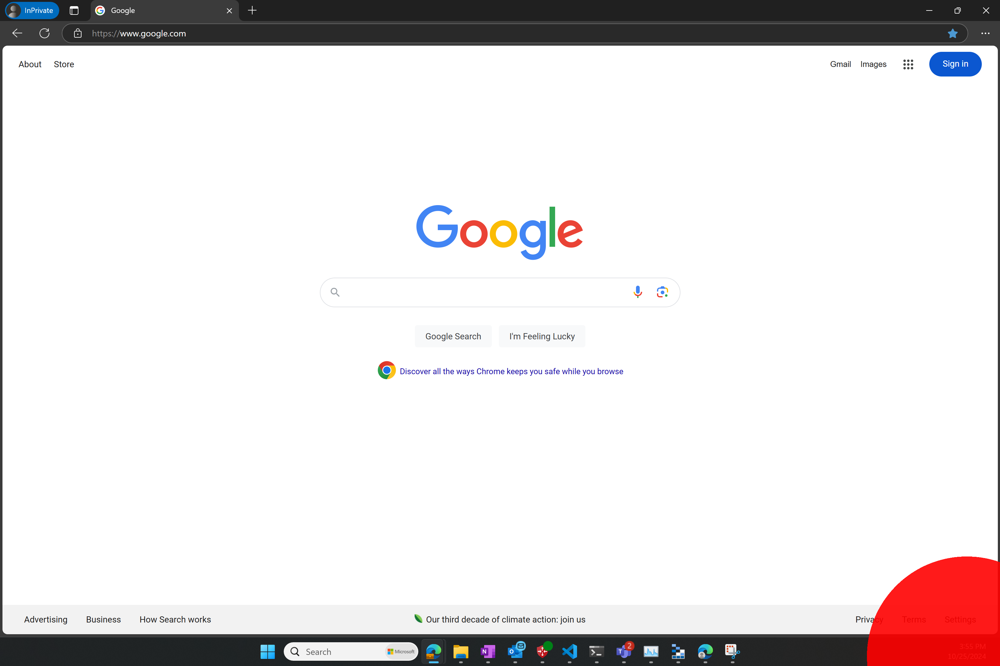

caption: A calendar date or time indicator., task_description: Find the time
similarity: 0.4188230633735657
task completed, element found..


In [8]:
import json

# age=15
# age = 27
# age = 35
# age = 65

pattern = eye_pattern_predictor.predict(age)
elements_ref = result["attention_distribution"].copy()
elements = elements_ref.copy()
last_element = None
scan = False

while elements:
    curr_window = elements[:5]
    
    scores = np.array([point["scores"] for point in curr_window])
    exp_scores = np.exp(scores - np.max(scores))  # Softmax and ubtract max for numerical stability
    confidences = exp_scores / exp_scores.sum()    
    
    if scan:
        print(f"scanning {pattern}..")
        element = find_next_element_scan(elements_ref, pattern, last_element)
    else:
        if confidences[0] < confidence_threshold:
            # means the user is not confident about the icon, use scanning pattern to find the icon
            print(f"not confident, switching to scanning pattern: {pattern}")
            elements_ref = [point for point in elements_ref if point["candidate_type"] != "platform_hotspot"]
            print("elements_ref: ", len(elements_ref))
            elements = elements_ref.copy()
            scan = True
            last_element = None
            continue
        
        print("guessing next element..")
        if last_element:
            elements.remove(last_element)
        element = elements[0]
        
    if not element:
        print("no element found..")
        break
    
    print(f"element: {json.dumps(element, indent=4)}")
    
    draw_attention(element, image, alpha=0.9)
    
    image_width, image_height = image.size
    x, y = element["position"]
    
    # Convert normalized coordinates to pixel coordinates
    pixel_x = int(x * image_width)
    pixel_y = int(y * image_height)
    
    # Calculate bounding box size (15% of image width)
    ratio = {
        Platform.ANDROID: 0.15,
        Platform.IOS: 0.15,
        Platform.DESKTOP: 0.04
    }
    
    box_size = int(ratio[platform] * image_width)
    
    # Calculate initial crop coordinates
    x1 = pixel_x - box_size // 2
    y1 = pixel_y - box_size // 2
    
    # Adjust coordinates if they go beyond image bounds while maintaining square shape
    if x1 < 0:
        x1 = 0
        x2 = box_size
    elif x1 + box_size > image_width:
        x2 = image_width
        x1 = image_width - box_size
    else:
        x2 = x1 + box_size
        
    if y1 < 0:
        y1 = 0
        y2 = box_size
    elif y1 + box_size > image_height:
        y2 = image_height
        y1 = image_height - box_size
    else:
        y2 = y1 + box_size
    
    # Convert PIL Image to numpy array, crop, and convert back to PIL Image
    image_array = np.array(image)
    cropped_array = image_array[y1:y2, x1:x2, :]  # Include all channels
    cropped_icon = Image.fromarray(cropped_array)
    
    if evaluate_cropped_icon(cropped_icon, task_description):
        print("task completed, element found..")
        break
    
    print("task not completed, element not found..")
    last_element = element